In [ ]:
!pip install pandas geopandas numpy
!pip install folium
!pip install pmdarima
!pip install statsmodels
!pip install tensorflow sklearn

In [2]:
from IPython.display import display

import glob

import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 15)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import geopandas as gpd
import folium
from folium import plugins

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.stats import gaussian_kde
import matplotlib.patches as mpatches
from pandas.plotting import register_matplotlib_converters

register_matplotlib_converters()

from sklearn.metrics import mean_absolute_error
import pmdarima as pm
from typing import Tuple
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from time import time
import seaborn as sns
sns.set(style="whitegrid")

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.preprocessing.sequence import TimeseriesGenerator
from keras import backend as K

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

ModuleNotFoundError: No module named 'numpy'

# Load Data

## Load numeric data from dataset

In [158]:
# Read the dataset into a Pandas DataFrame
# dataset_path = 'gdrive/MyDrive/Homework_IMDEA/Cleaned_Dataset/Hourly/'
dataset_path = './cleaned_dataset/'


file_list = glob.glob(dataset_path + '*.csv')

data = pd.DataFrame()

for file in file_list:
  data = pd.concat([data, pd.read_csv(file, parse_dates=['time_interval'])])

# Load Data Name
data['day_of_week'] = data['time_interval'].dt.day_name()
data = data.sort_values(['square_id', 'time_interval'])
data

,square_id,time_interval,internet_traffic,day_of_week
0,1,2013-10-31 23:00:00,57.799009,Thursday
1,1,2013-11-01 00:00:00,44.046899,Friday
2,1,2013-11-01 01:00:00,41.207149,Friday
3,1,2013-11-01 02:00:00,33.022070,Friday
4,1,2013-11-01 03:00:00,31.376930,Friday
...,...,...,...,...
239054,10000,2014-01-01 18:00:00,107.472027,Wednesday
239055,10000,2014-01-01 19:00:00,103.692309,Wednesday
239056,10000,2014-01-01 20:00:00,92.319474,Wednesday
239057,10000,2014-01-01 21:00:00,91.574316,Wednesday


In [4]:
data.dtypes

square_id                    int64
time_interval       datetime64[ns]
internet_traffic           float64
day_of_week                 object
dtype: object


---

## Load Geo data from geojson file
Now We laod the geoJSON to show th cells all over Milan


In [6]:
file_path = './milano-grid.geojson'

gdf = gpd.read_file(file_path)

gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   cellId    10000 non-null  int64   
 1   geometry  10000 non-null  geometry
dtypes: geometry(1), int64(1)
memory usage: 156.4 KB


In [7]:
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)

for _, row in gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    folium.GeoJson(geometry).add_to(map_milan)


Showing the cells on map

In [9]:
map_milan

# Task 1

## 1.1) Plot PDF

The assessment asked us to calculate the PDF for a data of 10,000 length that each one is the total Internet Traffic of a cell in Milan for total of 2 mont.

### Extract the data from inside the main data

In [13]:
# Calculate total internet traffic of each square_id 
total_traffic_per_cell = data[['square_id', 'internet_traffic']].groupby('square_id').sum().reset_index()

total_traffic_per_cell.head(5)

,square_id,internet_traffic
0,1,92992.666580
1,2,93368.388389
2,3,93768.329391
3,4,91904.381588
4,5,83630.697355




---
### Plot PDF




Now that we want to plot the PDF, we have 2 methods:
1.   hist function
2.   Gaussian_kde


For the hist method we have to set a bin value. That is the number of group the data is divided into. So for the optimum bin, we have two methods that are:


1.   Sturges' rule
2.   Freedman-Diaconis rule

#### ***Sturges' rule***

The number of bins at Sturges rule is =  14


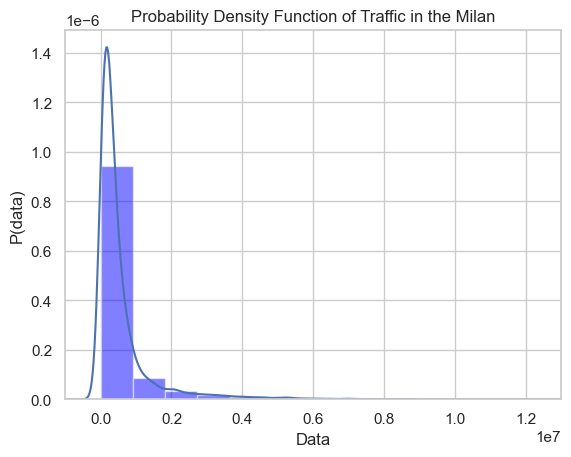

In [47]:
# Compute the number of samples in the data
n = len(total_traffic_per_cell)

# Compute the optimum number of bins using Sturges' rule
k = int(np.ceil(np.log2(n)))
print("The number of bins at Sturges rule is = ", k)

# Plot a histogram of the data using the optimum number of bins
plt.hist(total_traffic_per_cell['internet_traffic'], bins = k , density=True, color='blue', alpha=0.5)
total_traffic_per_cell['internet_traffic'].plot(kind='density')
# Set the x-axis limits
plt.xlim([-0.1*1e7, 1.3*1e7])

# Add labels and title to the plot
plt.xlabel('Data')
plt.ylabel('P(data)')
plt.title('Probability Density Function of Traffic in the Milan')

# Show the plot
plt.show()

#### ***Freedman-Diaconis rule***

The number of bins at Freedman-Diaconis rule is =  298


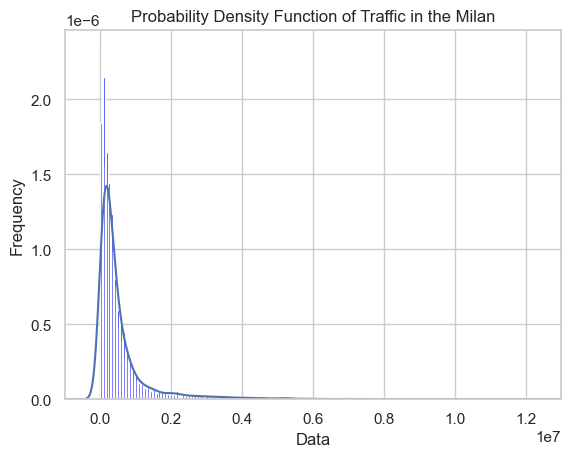

In [51]:
# Compute the interquartile range of the data
iqr = total_traffic_per_cell['internet_traffic'].quantile(0.75) - total_traffic_per_cell['internet_traffic'].quantile(0.25)

# Compute the number of samples in the data
n = len(total_traffic_per_cell['internet_traffic'])

# Compute the optimum number of bins using Freedman-Diaconis rule
bin_width = 2 * iqr / (n ** (1/3))

k = int((total_traffic_per_cell['internet_traffic'].max() - total_traffic_per_cell['internet_traffic'].min()) / bin_width)
print("The number of bins at Freedman-Diaconis rule is = ", k)

# Plot a histogram of the data using the optimum number of bins
# total_traffic_per_cell['internet_traffic'].head(50)
plt.hist(total_traffic_per_cell['internet_traffic'], bins=k , density=True, color='blue', alpha=1)
total_traffic_per_cell['internet_traffic'].plot(kind='density')
# Set the x-axis limits
plt.xlim([-0.1*1e7, 1.3*1e7])

# Add labels and title to the plot
plt.xlabel('Data')
plt.ylabel('Frequency')
plt.title('Probability Density Function of Traffic in the Milan')

# Show the plot
plt.show()

#### ***Gaussian kde***

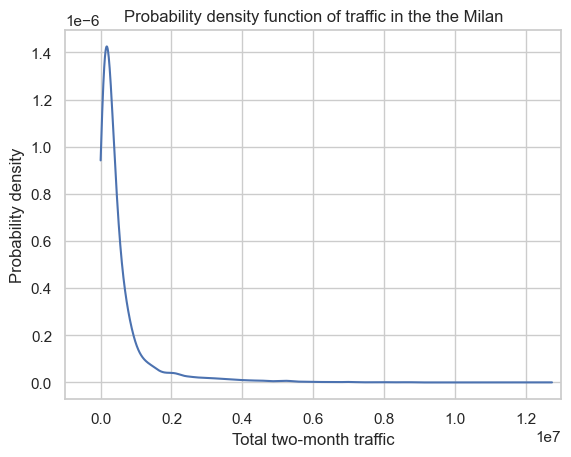

In [53]:
# Compute the total two-month traffic for each geographical area
traffic = data.groupby('square_id')['internet_traffic'].sum()

# Compute the probability density function of the traffic in the target city
density = gaussian_kde(traffic)

# Plot the probability density function
x = np.linspace(0, max(traffic), 2000)
plt.plot(x, density(x))
# Set the x-axis limits
plt.xlim([-0.1*1e7, 1.3*1e7])
plt.xlabel('Total two-month traffic')
plt.ylabel('Probability density')
plt.title('Probability density function of traffic in the the Milan')
plt.show()

#### ***Extra Analysis on PDF***

Mean traffic: 555289.418737023
80% of the traffic is between 213.62653467298063 and 3470412.485356268
90% of the traffic is between 213.62653467298063 and 4957698.5751301395
95% of the traffic is between 213.62653467298063 and 6069286.169406298


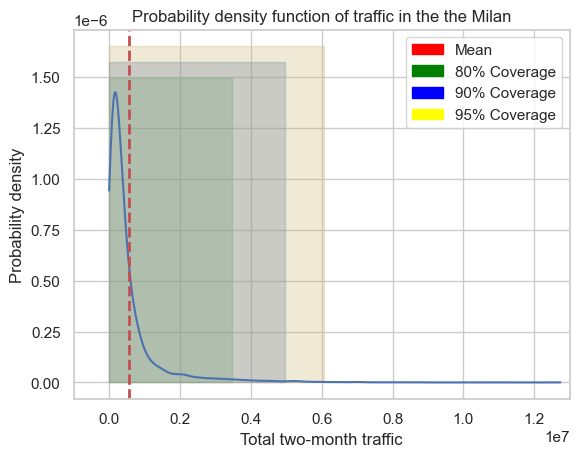

In [63]:
# Compute the total two-month traffic for each geographical area
traffic = data.groupby('square_id')['internet_traffic'].sum()

# Compute the probability density function of the traffic in the target city
density = gaussian_kde(traffic)

# Plot the probability density function
x = np.linspace(0, max(traffic), 2000)
plt.plot(x, density(x))

# Compute and plot the mean
mean_traffic = np.mean(traffic)
print(f'Mean traffic: {mean_traffic}')
mean_line = plt.axvline(mean_traffic, color='r', linestyle='dashed', linewidth=2)

# Compute and plot the region that contains 80% of the data
sorted_traffic = np.sort(traffic)
cumulative_traffic = np.cumsum(sorted_traffic)


# 80% coverage
lower_bound_80 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.0 * cumulative_traffic[-1])]
upper_bound_80 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.8 * cumulative_traffic[-1])]
print(f'80% of the traffic is between {lower_bound_80} and {upper_bound_80}')
plt.fill_betweenx([0, plt.ylim()[1]], lower_bound_80, upper_bound_80, color='g', alpha=0.3)

# 90% coverage
lower_bound_90 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.00 * cumulative_traffic[-1])]
upper_bound_90 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.90 * cumulative_traffic[-1])]
print(f'90% of the traffic is between {lower_bound_90} and {upper_bound_90}')
plt.fill_betweenx([0, plt.ylim()[1]], lower_bound_90, upper_bound_90, color='b', alpha=0.3)

# 95% coverage
lower_bound_95 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.0 * cumulative_traffic[-1])]
upper_bound_95 = sorted_traffic[np.searchsorted(cumulative_traffic, 0.95 * cumulative_traffic[-1])]
print(f'95% of the traffic is between {lower_bound_95} and {upper_bound_95}')
plt.fill_betweenx([0, plt.ylim()[1]], lower_bound_95, upper_bound_95, color='y', alpha=0.3)

# Set the x-axis limits
plt.xlim([-0.1*1e7, 1.3*1e7])

# Add labels, legend, and title to the plot
plt.xlabel('Total two-month traffic')
plt.ylabel('Probability density')
plt.title('Probability density function of traffic in the the Milan')

red_patch = mpatches.Patch(color='red', label='Mean')
green_patch = mpatches.Patch(color='green', label='80% Coverage')
blue_patch = mpatches.Patch(color='blue', label='90% Coverage')
yellow_patch = mpatches.Patch(color='yellow', label='95% Coverage')

plt.legend(handles=[red_patch, green_patch, blue_patch, yellow_patch])

# Show the plot
plt.show()


## Task 1.2 Compare the cells most traffic and 2 other

Task of comparing cells with most traffic. In this task we are going to compare the internet traffic for 3 seperate Cells in city of Milan.

Steps are:


1.   Find the cell with most traffic in duration of two month
2.   Show the traffic plot of three cells for period of the first two weeks
3.   Plot the mean traffic for three cells for the whol two month. 



---



### Finding the cell with most traffic
Here it is


In [64]:
# Calculate the cell with most traffic for total of 2 month
max_traffic_square_id = int(total_traffic_per_cell.iloc[total_traffic_per_cell.idxmax()['internet_traffic']].square_id)

print(max_traffic_square_id)
total_traffic_per_cell.sort_values('internet_traffic', ascending=False).head(5)

5161


,square_id,internet_traffic
5160,5161,1.274006e+07
5058,5059,1.117085e+07
5258,5259,1.048578e+07
5060,5061,9.584334e+06
5257,5258,8.707440e+06


The max for two month is 5161

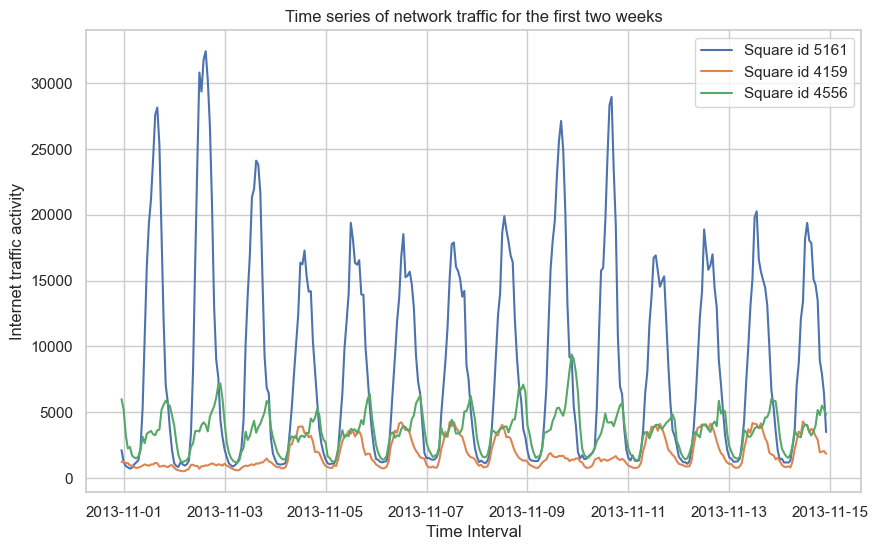

In [66]:
# Plot the internet traffic of first two weeks for selected cells
two_weeks_data = data[data['time_interval'] < data['time_interval'].min() + pd.Timedelta(weeks=2)].sort_values('time_interval')

# Extract time series for the three areas
max_traffic_cell = two_weeks_data[two_weeks_data['square_id'] == max_traffic_square_id]
cell_4159_traffic = two_weeks_data[two_weeks_data['square_id'] == 4159]
cell_4556_traffic = two_weeks_data[two_weeks_data['square_id'] == 4556]

plt.figure(figsize=(10, 6))

plt.plot(max_traffic_cell['time_interval'], max_traffic_cell['internet_traffic'], label=f'Square id {max_traffic_square_id}')
plt.plot(cell_4159_traffic['time_interval'], cell_4159_traffic['internet_traffic'], label='Square id 4159')
plt.plot(cell_4556_traffic['time_interval'], cell_4556_traffic['internet_traffic'], label='Square id 4556')

plt.xlabel('Time Interval')
plt.ylabel('Internet traffic activity')
plt.title('Time series of network traffic for the first two weeks')

plt.legend()
plt.show()

traffic of first two weeks for this three cells





---

### The place of these Cells on the map


In [ ]:

cell_ids_to_display = [max_traffic_square_id, 4159, 4556]

filtered_gdf = gdf[gdf['cellId'].isin(cell_ids_to_display)]
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)
for _, row in filtered_gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    cell_polygon = folium.GeoJson(geometry, style_function=lambda x: {'fillColor': 'transparent', 'color': 'black'})
    cell_popup = folium.Popup(f"Cell ID: {cell_id}", show=True)
    folium.CircleMarker(location=[geometry.centroid.y, geometry.centroid.x], radius=5, color='red', fill=True).add_to(map_milan)
    cell_popup.add_to(cell_polygon)
    cell_polygon.add_to(map_milan)

map_milan

In the following parts we are going to calculate the mean traffic for duration of a weak for these cells

In [71]:
two_weeks_data = data[data['time_interval'] < data['time_interval'].min() + pd.Timedelta(weeks=2)].sort_values('time_interval')

ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

two_weeks_data.dtypes

square_id                    int64
time_interval       datetime64[ns]
internet_traffic           float64
day_of_week                 object
dtype: object

In [72]:
# Add the hour column
two_weeks_data['hour'] = two_weeks_data['time_interval'].dt.hour

two_weeks_data

,square_id,time_interval,internet_traffic,day_of_week,hour
0,1,2013-10-31 23:00:00,57.799009,Thursday,23
27480,1146,2013-10-31 23:00:00,316.554234,Thursday,23
30408,1268,2013-10-31 23:00:00,148.283900,Thursday,23
176136,7340,2013-10-31 23:00:00,569.130111,Thursday,23
107856,4495,2013-10-31 23:00:00,115.018981,Thursday,23
...,...,...,...,...,...
86423,3601,2013-11-14 22:00:00,15.348690,Thursday,22
86447,3602,2013-11-14 22:00:00,15.348690,Thursday,22
86471,3603,2013-11-14 22:00:00,15.348690,Thursday,22
86279,3595,2013-11-14 22:00:00,284.064722,Thursday,22


In [73]:
# Map the hour of each day to the hour from start of the week

day_to_hours = {'Monday': 0, 'Tuesday': 24, 'Wednesday': 48, 'Thursday': 72, 'Friday': 96, 'Saturday': 120, 'Sunday': 144}

two_weeks_data['hour_of_week'] = two_weeks_data['day_of_week'].map(day_to_hours) + two_weeks_data['hour']

two_weeks_data

,square_id,time_interval,internet_traffic,day_of_week,hour,hour_of_week
0,1,2013-10-31 23:00:00,57.799009,Thursday,23,95
27480,1146,2013-10-31 23:00:00,316.554234,Thursday,23,95
30408,1268,2013-10-31 23:00:00,148.283900,Thursday,23,95
176136,7340,2013-10-31 23:00:00,569.130111,Thursday,23,95
107856,4495,2013-10-31 23:00:00,115.018981,Thursday,23,95
...,...,...,...,...,...,...
86423,3601,2013-11-14 22:00:00,15.348690,Thursday,22,94
86447,3602,2013-11-14 22:00:00,15.348690,Thursday,22,94
86471,3603,2013-11-14 22:00:00,15.348690,Thursday,22,94
86279,3595,2013-11-14 22:00:00,284.064722,Thursday,22,94


### Plot of the Internet Traffic

In this part we plot with two granularity, 1) week days, 2) 8 Hours of week days

In [74]:
mean_traffic = two_weeks_data.groupby(['square_id', 'hour_of_week'])['internet_traffic'].mean().reset_index()

mean_traffic_max = mean_traffic[mean_traffic['square_id'] == max_traffic_square_id]
mean_traffic_4159 = mean_traffic[mean_traffic['square_id'] == 4159]
mean_traffic_4556 = mean_traffic[mean_traffic['square_id'] == 4556]

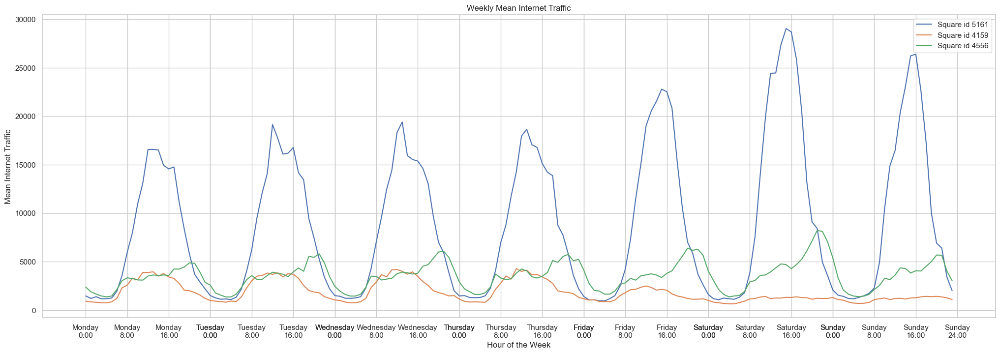

In [76]:
fig, ax = plt.subplots(figsize=(25, 8))

mean_traffic_max.plot(x='hour_of_week', y='internet_traffic', ax=ax, label=f'Square id {max_traffic_square_id}')
mean_traffic_4159.plot(x='hour_of_week', y='internet_traffic', ax=ax, label='Square id 4159')
mean_traffic_4556.plot(x='hour_of_week', y='internet_traffic', ax=ax, label='Square id 4556')

ax.set_xlabel('Hour of the Week')
ax.set_ylabel('Mean Internet Traffic')

# Define the x-axis ticks and labels
xticks = [24*i+j for i in range(7) for j in range(0, 25, 8)]
xticklabels = [f'{day}\n{hour}:00' for day in ordered_days for hour in range(0, 25, 8)]

ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_title('Weekly Mean Internet Traffic')
ax.legend()

plt.show()

## Task 1.3 Extra Analysis

Dig deeper data

### Peak Traffic Analysis


In [ ]:
# Group by time interval and sum the traffic across all squares
city_traffic = data.groupby('time_interval')['internet_traffic'].sum()

# Identify the time intervals with the highest total traffic
peak_city_times = city_traffic.idxmax()

print("Peak traffic times across the entire city: ", peak_city_times)

Peak traffic times across the entire city:  2013-11-05 12:00:00


In [77]:
# Group by square and time interval
square_traffic = data.groupby(['square_id', 'time_interval'])['internet_traffic'].sum()

# Identify the time intervals with the highest traffic for each square
peak_square_times = square_traffic.groupby('square_id').idxmax()

print("Peak traffic times for each square: \n", peak_square_times)

Peak traffic times for each square: 
 square_id
1            (1, 2013-11-10 13:00:00)
2            (2, 2013-11-10 13:00:00)
3            (3, 2013-11-10 13:00:00)
4            (4, 2013-11-10 13:00:00)
5            (5, 2013-11-10 13:00:00)
                     ...             
9996      (9996, 2013-12-08 15:00:00)
9997      (9997, 2013-12-08 15:00:00)
9998      (9998, 2013-12-08 15:00:00)
9999      (9999, 2013-11-08 17:00:00)
10000    (10000, 2013-11-01 09:00:00)
Name: internet_traffic, Length: 10000, dtype: object


In [ ]:
# Extract the hour from each peak square time
peak_square_hours = peak_square_times.apply(lambda x: x[1].hour)

# Calculate the mean
mean_hour = peak_square_hours.mean()

In [ ]:
# Calculate the coefficients for 80%, 90%, and 95% coverage
coverage_80_coef = np.percentile(peak_square_hours, 80) - mean_hour
coverage_90_coef = np.percentile(peak_square_hours, 90) - mean_hour
coverage_95_coef = np.percentile(peak_square_hours, 95) - mean_hour

The 80 percent 90 pecent and 95 percent coverage of the total traffic

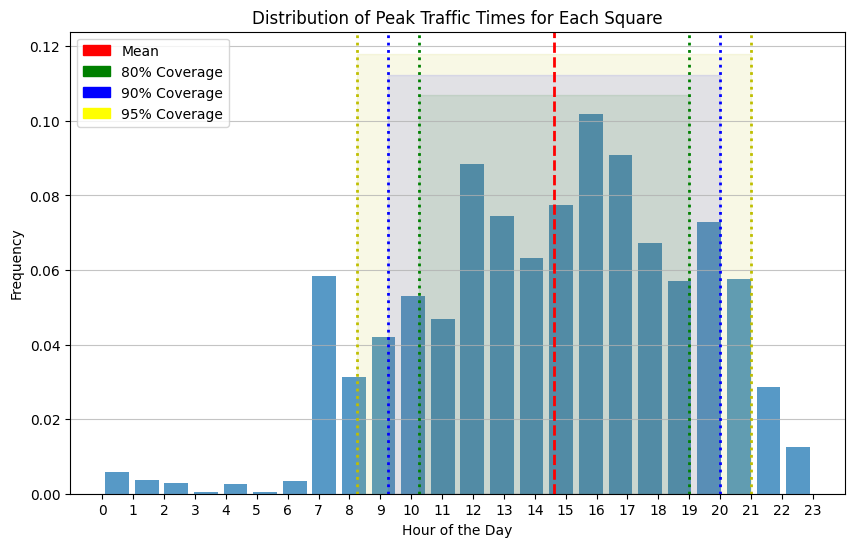

In [ ]:
plt.figure(figsize=(10,6))
n, bins, patches = plt.hist(peak_square_hours, bins=24, rwidth=0.8, density=True, alpha=0.75)
plt.title('Distribution of Peak Traffic Times for Each Square')
plt.xlabel('Hour of the Day')
plt.ylabel('Frequency')
plt.xticks(range(24))

mean_line = plt.axvline(mean_hour, color='r', linestyle='dashed', linewidth=2)

coverage_80_line1 = plt.axvline(mean_hour - coverage_80_coef, color='g', linestyle='dotted', linewidth=2)
coverage_80_line2 = plt.axvline(mean_hour + coverage_80_coef, color='g', linestyle='dotted', linewidth=2)

coverage_90_line1 = plt.axvline(mean_hour - coverage_90_coef, color='b', linestyle='dotted', linewidth=2)
coverage_90_line2 = plt.axvline(mean_hour + coverage_90_coef, color='b', linestyle='dotted', linewidth=2)

coverage_95_line1 = plt.axvline(mean_hour - coverage_95_coef, color='y', linestyle='dotted', linewidth=2)
coverage_95_line2 = plt.axvline(mean_hour + coverage_95_coef, color='y', linestyle='dotted', linewidth=2)

plt.fill_betweenx([0, plt.ylim()[1]], mean_hour - coverage_80_coef, mean_hour + coverage_80_coef, color='g', alpha=0.1)
plt.fill_betweenx([0, plt.ylim()[1]], mean_hour - coverage_90_coef, mean_hour + coverage_90_coef, color='b', alpha=0.1)
plt.fill_betweenx([0, plt.ylim()[1]], mean_hour - coverage_95_coef, mean_hour + coverage_95_coef, color='y', alpha=0.1)

red_patch = mpatches.Patch(color='red', label='Mean')
green_patch = mpatches.Patch(color='green', label='80% Coverage')
blue_patch = mpatches.Patch(color='blue', label='90% Coverage')
yellow_patch = mpatches.Patch(color='yellow', label='95% Coverage')

plt.legend(handles=[red_patch, green_patch, blue_patch, yellow_patch])

plt.grid(axis='y', alpha=0.75)
plt.show()



---
### Correlation
Here we want to evaluate if there are any correlation between areas for rising and falling internet traffic?

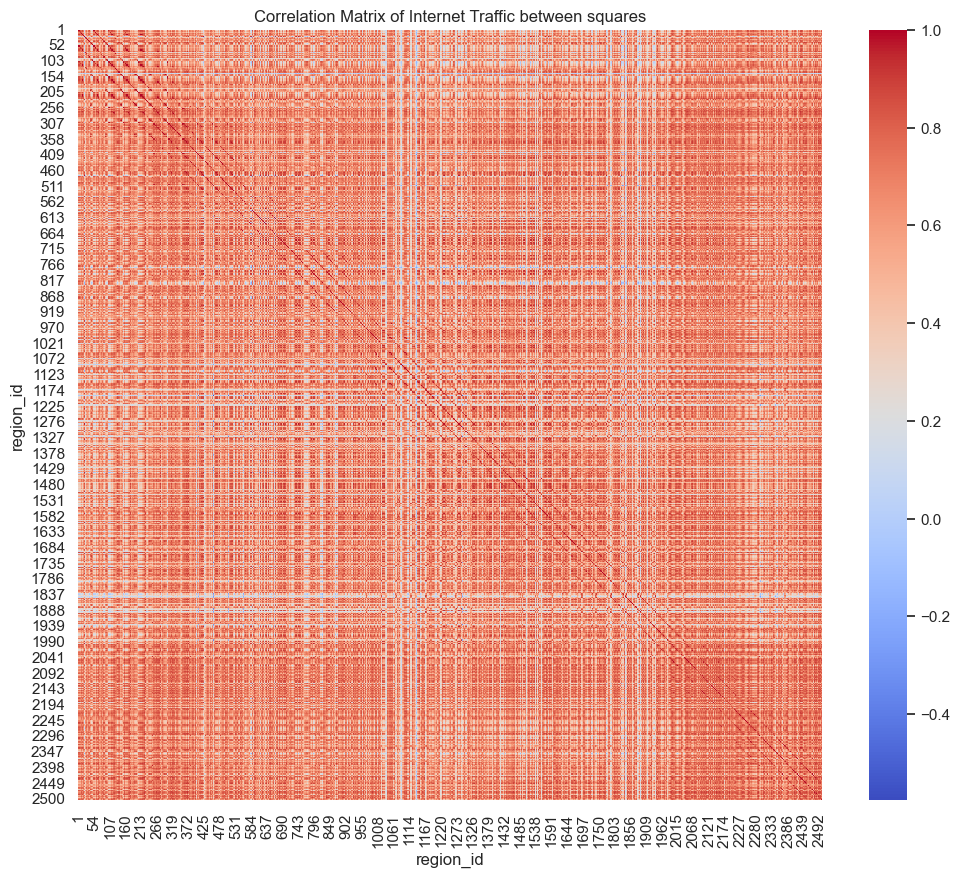

In [113]:
def group_squares(square_id):
    # This function groups the squares into larger squares. Each larger square consists of 4 smaller squares.
    # For a 100x100 grid, the smaller squares (1,2,101,102), (3,4,103,104), etc. are grouped together.  
    row = (square_id - 1) // 100 
    col = (square_id - 1) % 100 
    return (row // 2) * 50 + (col // 2) + 1

data['region_id'] = data['square_id'].apply(group_squares)

grouped_data = data.groupby(['time_interval', 'region_id'])['internet_traffic'].sum().reset_index()

pivot_data = grouped_data.pivot(index='time_interval', columns='region_id', values='internet_traffic')

correlation_matrix = pivot_data.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix of Internet Traffic between squares')
plt.show()



---
### Correlation for bigger regions
Here we want to evaluate if there are any correlation between areas for rising and falling internet traffic?

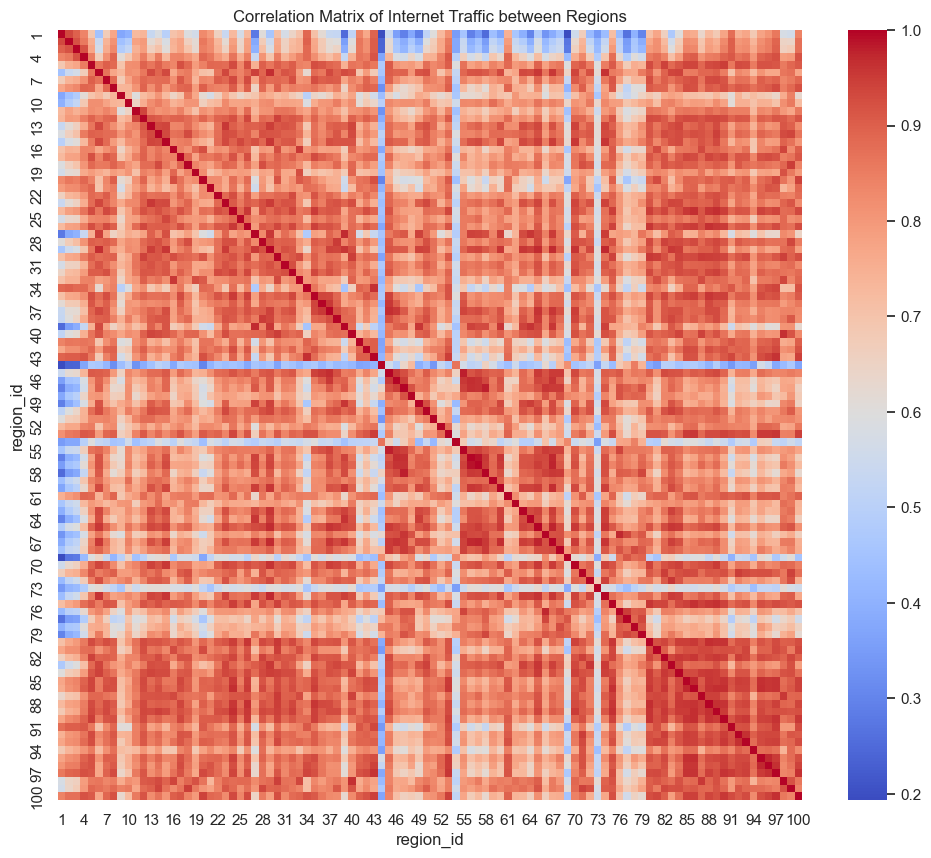

In [100]:
def group_squares(square_id):
    # This function groups the squares into larger squares. Each larger square consists of 100 smaller squares.
    # For a 10000 (100 * 100) grid, smaller squares from (1,2,3,...,10,101,102,...,110,...,901,902,...,910) and so on are grouped together.
    row = (square_id - 1) // 100 
    col = (square_id - 1) % 100 
    return (row // 10) * 10 + (col // 10) + 1

data['region_id'] = data['square_id'].apply(group_squares)

grouped_data = data.groupby(['time_interval', 'region_id'])['internet_traffic'].sum().reset_index()

pivot_data = grouped_data.pivot(index='time_interval', columns='region_id', values='internet_traffic')

correlation_matrix = pivot_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm')
plt.title('Correlation Matrix of Internet Traffic between Regions')
plt.show()



---
### Correlation for bigger regions and 1 hour lag
Here we want to evaluate if there are any correlation between areas for rising and falling internet traffic?

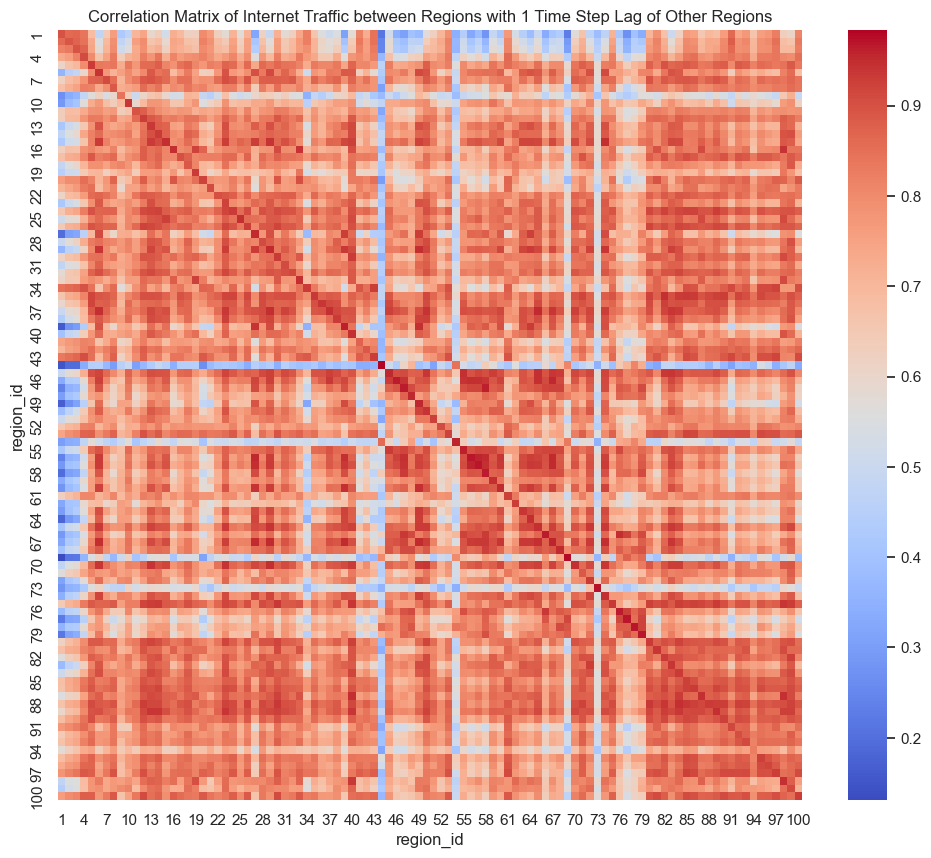

In [112]:
def group_squares(square_id):
    # This function groups the squares into larger squares. Each larger square consists of 100 smaller squares.
    row = (square_id - 1) // 100 
    col = (square_id - 1) % 100 
    return (row // 10) * 10 + (col // 10) + 1

data['region_id'] = data['square_id'].apply(group_squares)

grouped_data = data.groupby(['time_interval', 'region_id'])['internet_traffic'].sum().reset_index()

pivot_data = grouped_data.pivot(index='time_interval', columns='region_id', values='internet_traffic')

# Create a lagged DataFrame where each column is shifted by one time step
lagged_data = pivot_data.shift(1)

# Create an empty DataFrame to store the correlation coefficients
correlation_matrix_lag_1 = pd.DataFrame(index=pivot_data.columns, columns=pivot_data.columns)

for region in pivot_data.columns:
    for lagged_region in lagged_data.columns:
        # Compute the correlation of the current region with the lagged data of all other regions
        correlation_matrix_lag_1.loc[region, lagged_region] = pivot_data[region].corr(lagged_data[lagged_region])

# Convert the data in the correlation matrix to float type
correlation_matrix_lag_1 = correlation_matrix_lag_1.astype('float')

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_lag_1, cmap='coolwarm')
plt.title('Correlation Matrix of Internet Traffic between Regions with 1 Time Step Lag of Other Regions')
plt.show()


### Hotspot Analysis



In [126]:
# Identify the top 10 square_ids with the most internet traffic
top_squares = data.groupby('square_id')['internet_traffic'].sum().nlargest(10).index

# Filter the data to only include these top 10 square_ids
top_squares_data = data[data['square_id'].isin(top_squares)]

# Group by the 'day_of_week' and 'square_id' columns and calculate the mean internet traffic
top_squares_by_day = top_squares_data.groupby(['day_of_week', 'square_id'])['internet_traffic'].mean().reset_index()


In [131]:
print(f"The square IDs are: {', '.join(map(str, top_squares))}")

The square IDs are: 5161, 5059, 5259, 5061, 5258, 5159, 6064, 4855, 4856, 5262


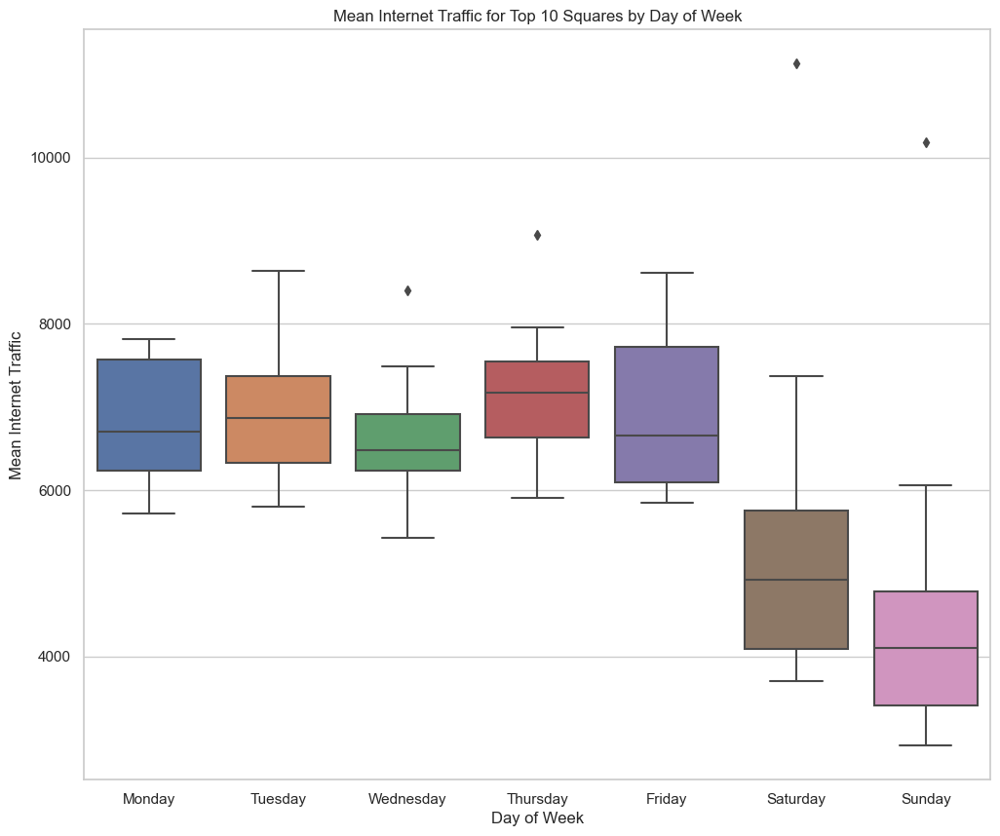

In [127]:
# Create the plot
plt.figure(figsize=(12, 10))
sns.boxplot(x='day_of_week', y='internet_traffic', data=top_squares_by_day, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Mean Internet Traffic for Top 10 Squares by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Mean Internet Traffic')
plt.show()

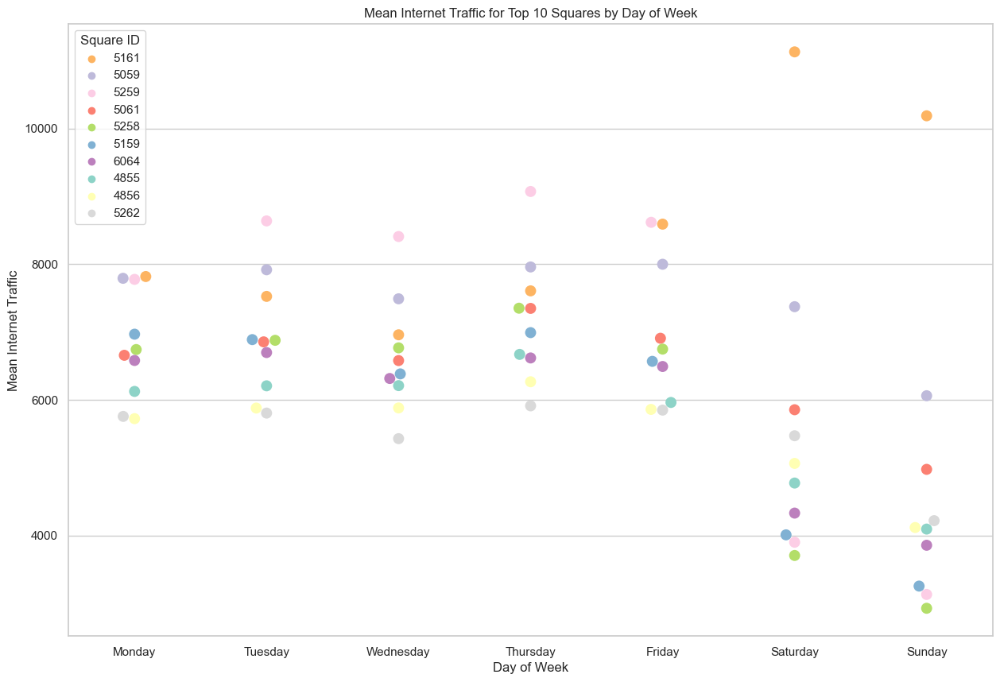

In [128]:
plt.figure(figsize=(15, 10))
sns.swarmplot(x='day_of_week', y='internet_traffic', hue='square_id', data=top_squares_by_day, 
              order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
              palette='Set3', size=10)
plt.title('Mean Internet Traffic for Top 10 Squares by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Mean Internet Traffic')

# Customizing the legend to be in order of traffic.
handles, labels = plt.gca().get_legend_handles_labels()
order = top_squares_by_day.groupby('square_id')['internet_traffic'].mean().sort_values(ascending=False).index
new_handles = [handles[labels.index(str(i))] for i in order]
new_labels = [labels[labels.index(str(i))] for i in order]
plt.legend(new_handles, new_labels, title='Square ID')

plt.show()

In [135]:
top_squares

Index([5161, 5059, 5259, 5061, 5258, 5159, 6064, 4855, 4856, 5262], dtype='int64', name='square_id')

In [137]:
cell_ids_to_display = top_squares

filtered_gdf = gdf[gdf['cellId'].isin(top_squares)]
map_milan = folium.Map(location=[45.4642, 9.1900], zoom_start=12)
for _, row in filtered_gdf.iterrows():
    cell_id = row['cellId']
    geometry = row['geometry']
    cell_polygon = folium.GeoJson(geometry, style_function=lambda x: {'fillColor': 'transparent', 'color': 'black'})
    cell_popup = folium.Popup(f"Cell ID: {cell_id}", show=True)
    folium.CircleMarker(location=[geometry.centroid.y, geometry.centroid.x], radius=5, color='red', fill=True).add_to(map_milan)
    cell_popup.add_to(cell_polygon)
    cell_polygon.add_to(map_milan)

map_milan

# Task 2

In this task we are going to predict the data based on previous datas



---
## 2.1 Define Test stationary function


For the forcasting we need to assure that the time sereies of MIlan's internet traffic is a stationary series. that means:

We first going to plot the original data of each city and then use the Dickey-Fuller test to evalutae whether the timeseries data is stationary or not.



----------
### Define method to plot the data and residual and perofmr the stationarity test

Define a function that plots the original, mean and std of the data given. 
Alongside the testing for being stationary 

In [139]:
def plt_and_test_stationarity(timeseries, square_id, label='Original'):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(window=24).mean()
    rolstd = timeseries.rolling(window=24).std()

    #Plot rolling statistics:
    plt.figure(figsize=(12, 6))
    orig = plt.plot(timeseries, color='blue',label=label)
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title(f'Rolling Mean & Standard Deviation for Square ID {square_id}')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    if isinstance(timeseries, pd.DataFrame):
        dftest = adfuller(timeseries['internet_traffic'].dropna(), autolag='AIC')
    else:
        dftest = adfuller(timeseries.dropna(), autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput[f'Critical Value {key}'] = value
    print(dfoutput)


-----------------------------------
### Dickey-Fuller test on Raw data for seasonality


The following code will cacluate plot the original data and the residual(data - trend - seasonality) and performs the Dickey-Fuller test for each. 

Here we use decomposition method to get the residual data.

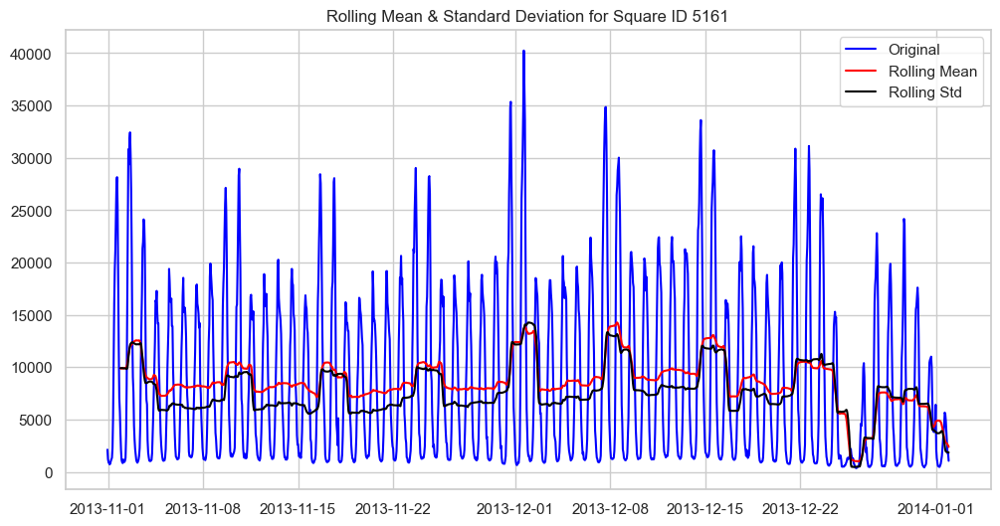

Results of Dickey-Fuller Test:
Test Statistic                   -3.900012
p-value                           0.002035
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


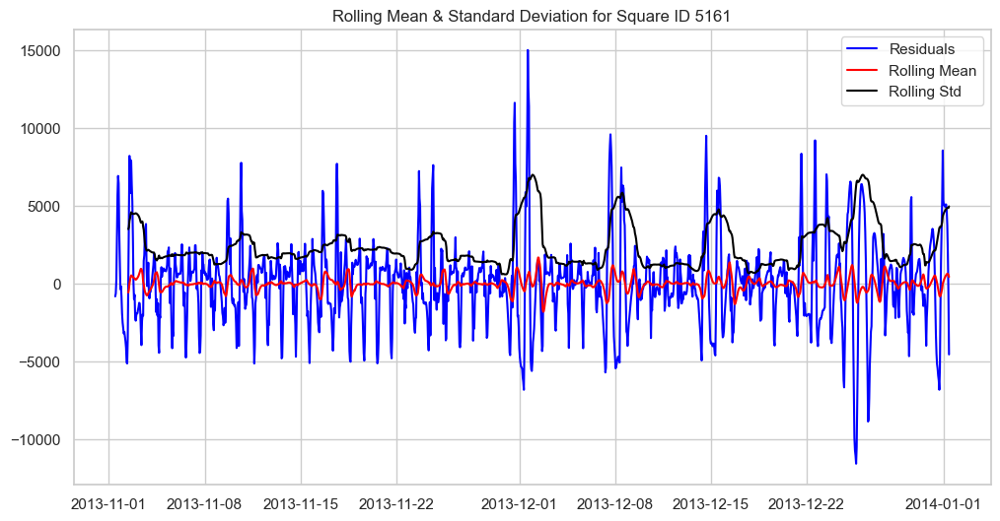

Results of Dickey-Fuller Test:
Test Statistic                -1.526702e+01
p-value                        4.773936e-28
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


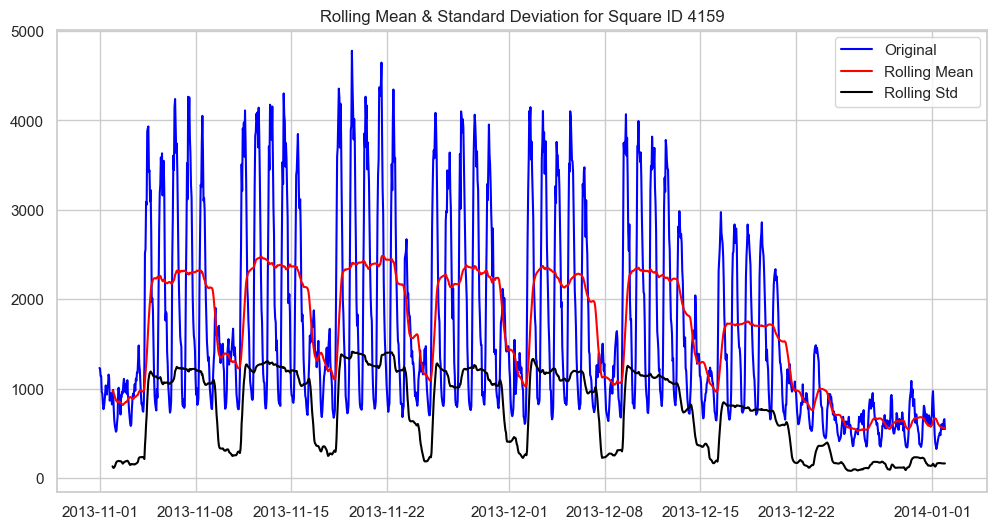

Results of Dickey-Fuller Test:
Test Statistic                   -3.670918
p-value                           0.004541
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


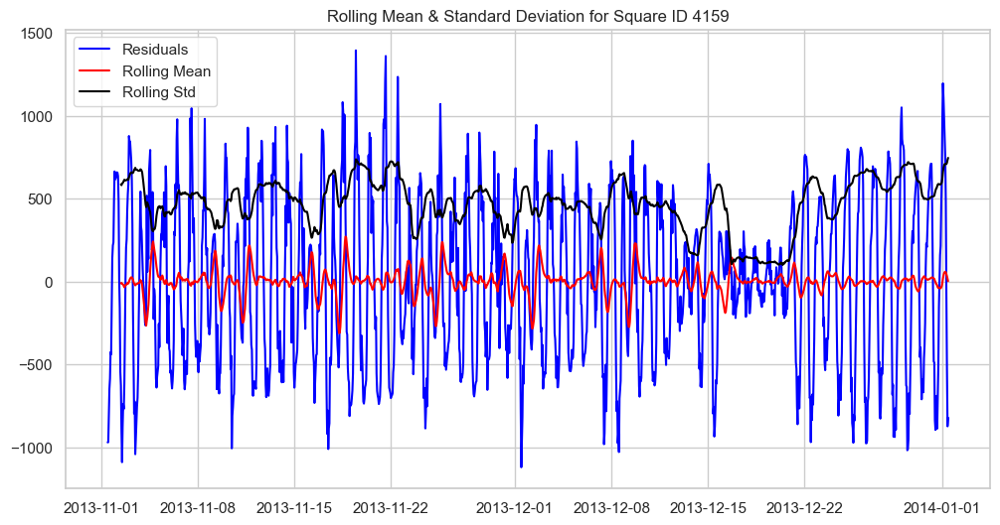

Results of Dickey-Fuller Test:
Test Statistic                -1.494633e+01
p-value                        1.299944e-27
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


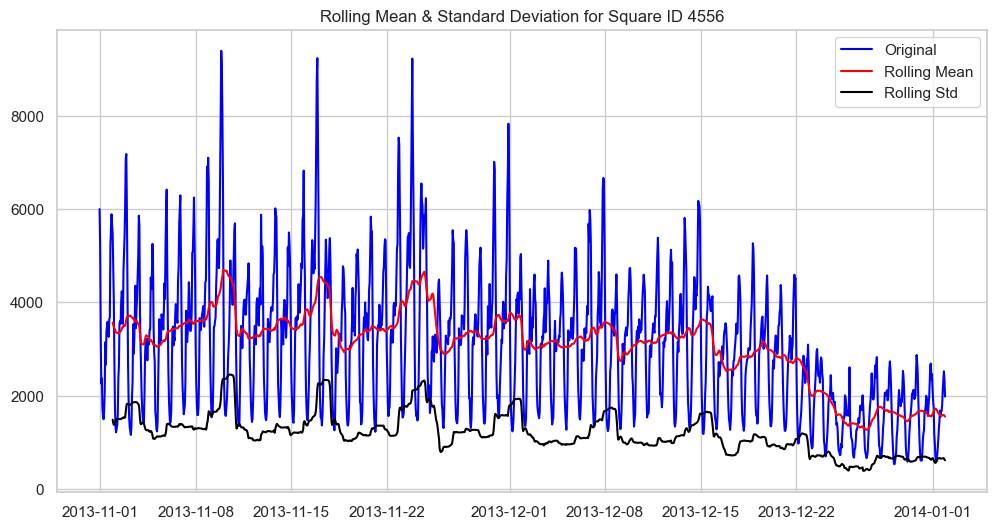

Results of Dickey-Fuller Test:
Test Statistic                   -1.775915
p-value                           0.392483
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


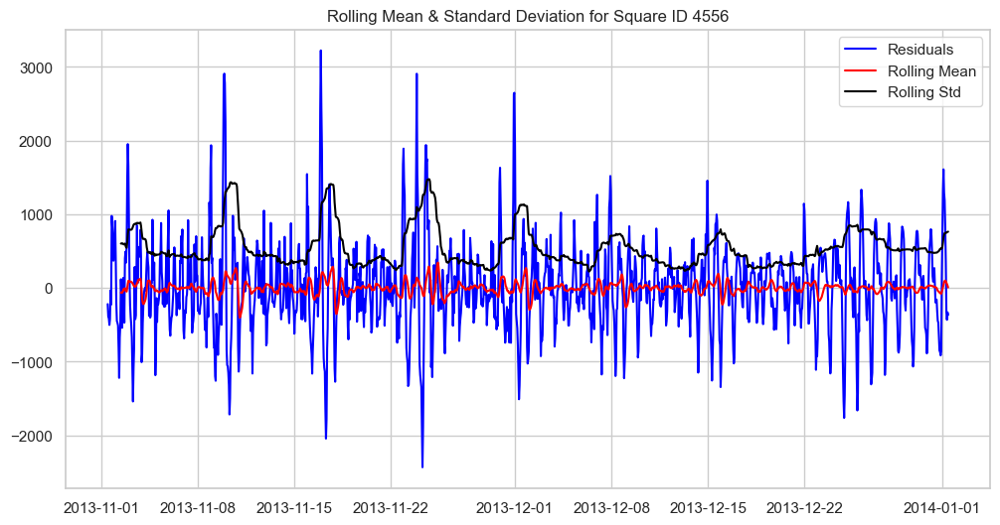

Results of Dickey-Fuller Test:
Test Statistic                -1.349556e+01
p-value                        3.046844e-25
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


In [148]:
# Perform the test for each square id:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]s

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    plt_and_test_stationarity(timeseries, square_id)

    # Decompose the time series
    df_square = timeseries['internet_traffic']
    decomposition = seasonal_decompose(df_square, model='additive', period=24)

    # Get the residuals
    residuals = decomposition.resid

    # Call the test_stationarity function for residuals
    plt_and_test_stationarity(residuals, square_id, label='Residuals')

### Applying log method to check if it helps our case timeseries to become more stationary

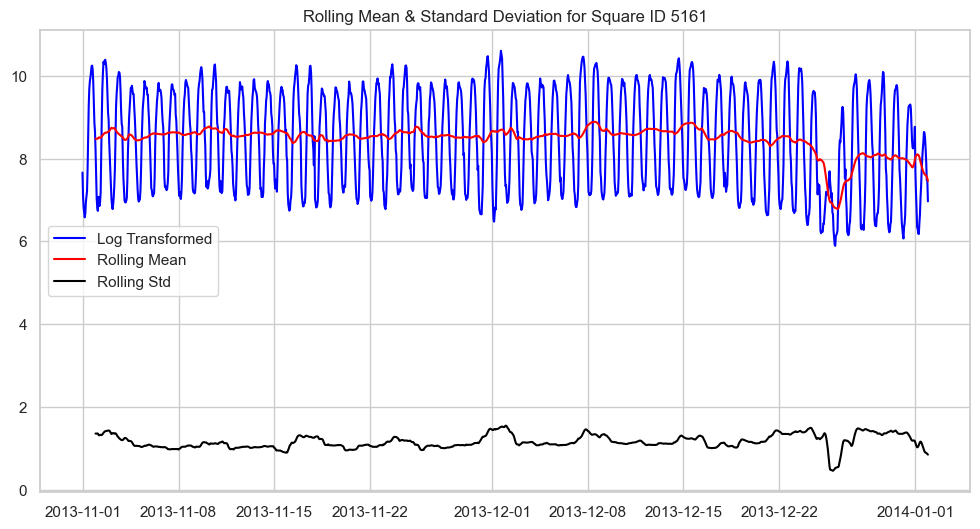

Results of Dickey-Fuller Test:
Test Statistic                   -1.761874
p-value                           0.399548
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


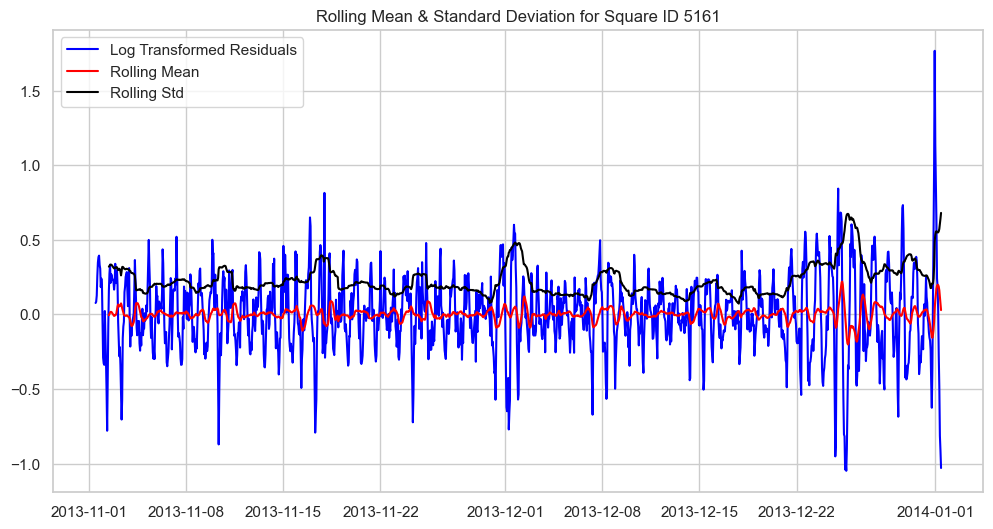

Results of Dickey-Fuller Test:
Test Statistic                -1.322480e+01
p-value                        9.851154e-25
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


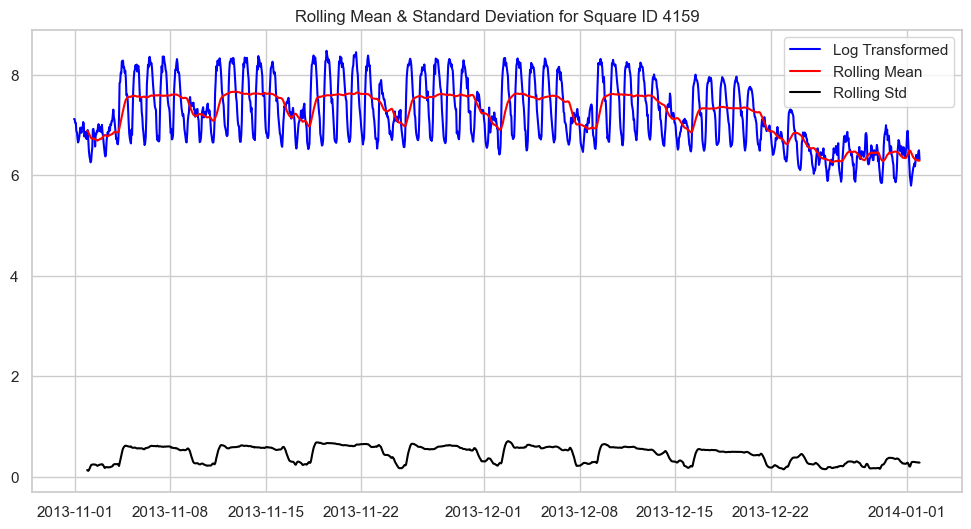

Results of Dickey-Fuller Test:
Test Statistic                   -2.355203
p-value                           0.154781
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


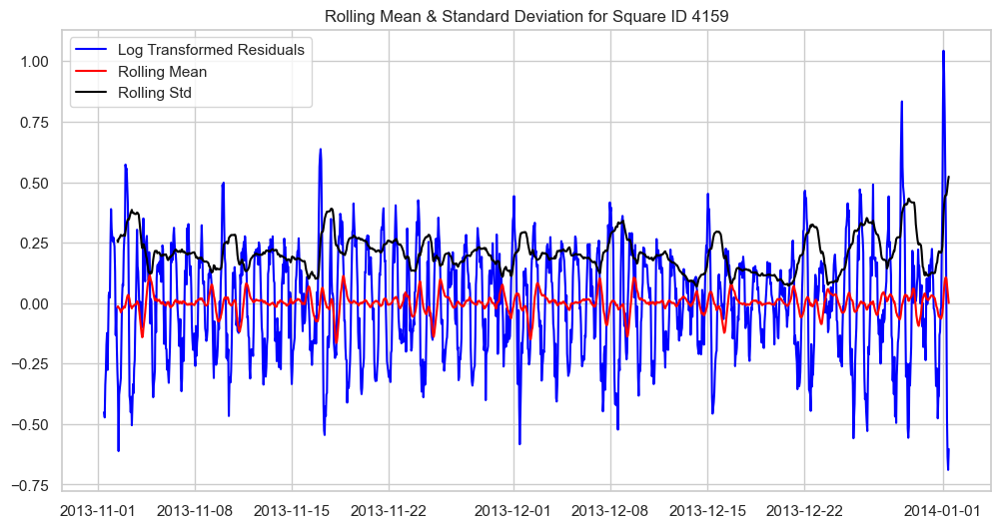

Results of Dickey-Fuller Test:
Test Statistic                -1.379283e+01
p-value                        8.860588e-26
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


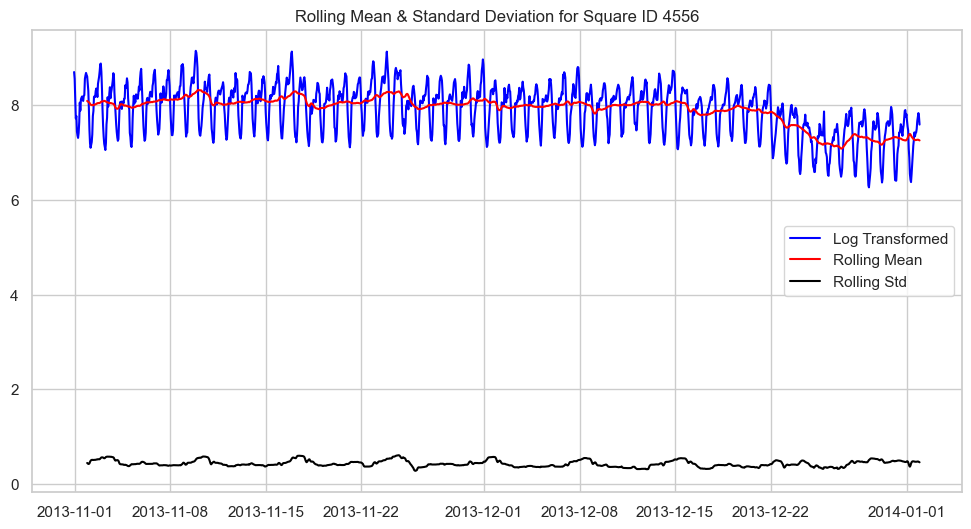

Results of Dickey-Fuller Test:
Test Statistic                   -0.670150
p-value                           0.854331
#Lags Used                       24.000000
Number of Observations Used    1463.000000
Critical Value 1%                -3.434828
Critical Value 5%                -2.863518
Critical Value 10%               -2.567823
dtype: float64


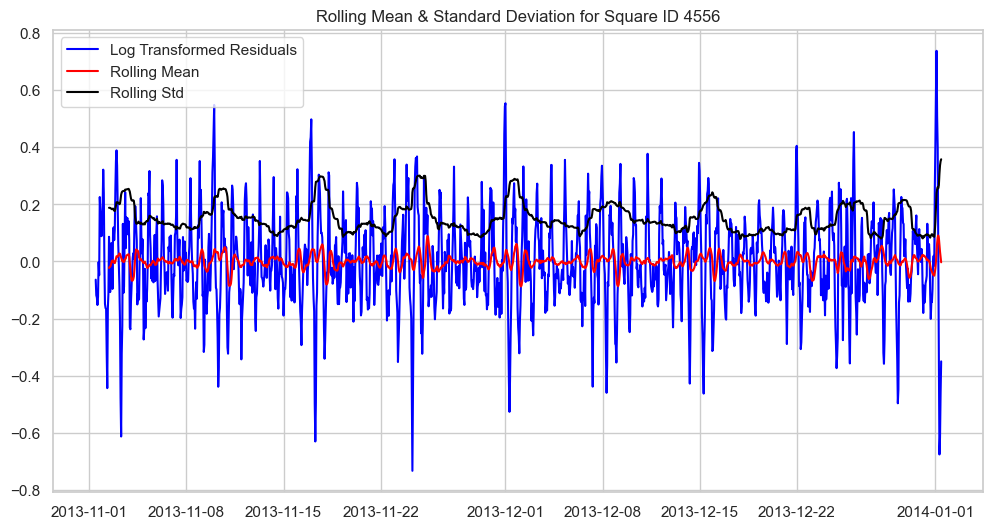

Results of Dickey-Fuller Test:
Test Statistic                -1.278408e+01
p-value                        7.310165e-24
#Lags Used                     2.400000e+01
Number of Observations Used    1.439000e+03
Critical Value 1%             -3.434902e+00
Critical Value 5%             -2.863551e+00
Critical Value 10%            -2.567840e+00
dtype: float64


In [150]:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    
    # Log transformation
    timeseries['log_traffic'] = np.log(timeseries['internet_traffic'])

    # Apply the test_stationarity function to the log transformed data
    plt_and_test_stationarity(timeseries['log_traffic'], square_id, label='Log Transformed')
    
    # Decompose the time series of log transformed data
    decomposition = seasonal_decompose(timeseries['log_traffic'], model='additive', period=24)

    # Get the residuals
    residuals = decomposition.resid

    # Call the test_stationarity function for residuals
    plt_and_test_stationarity(residuals, square_id, label='Log Transformed Residuals')

### Seasonality and Trend

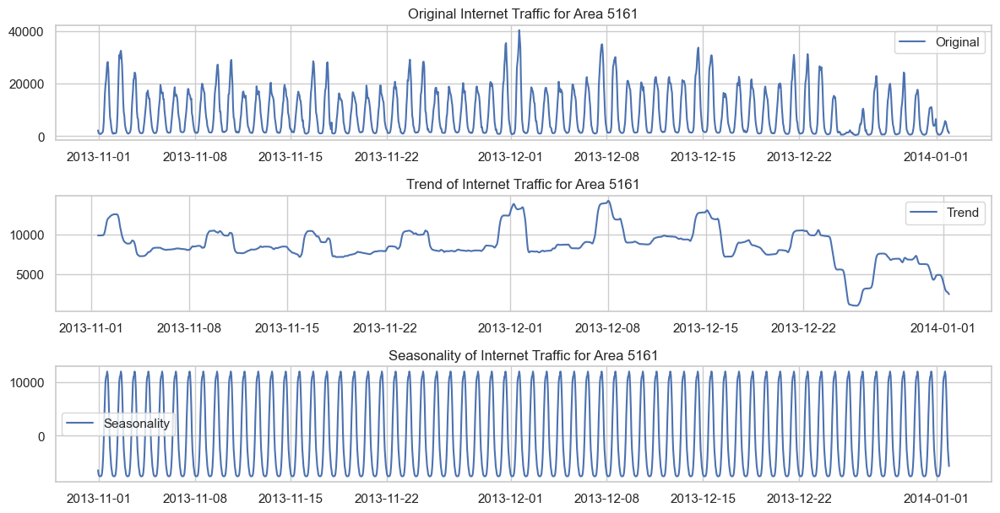

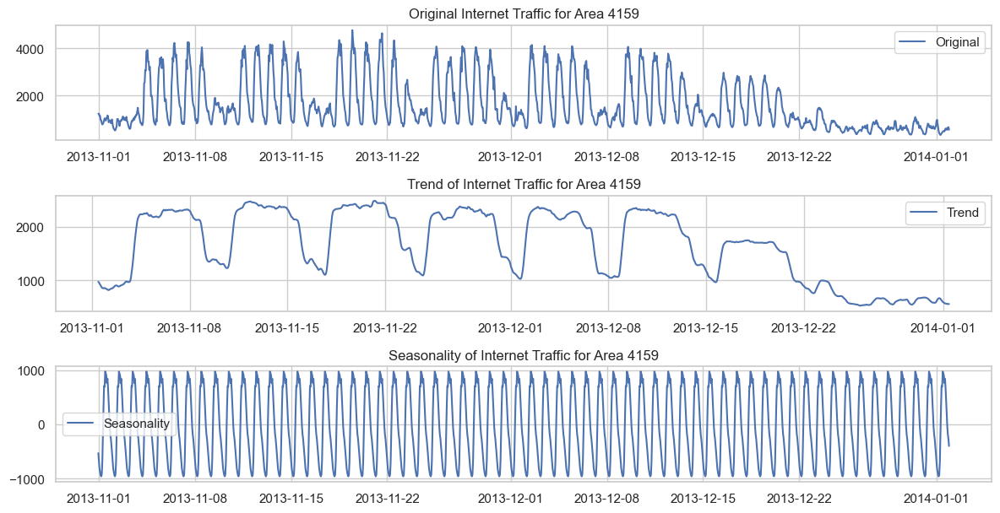

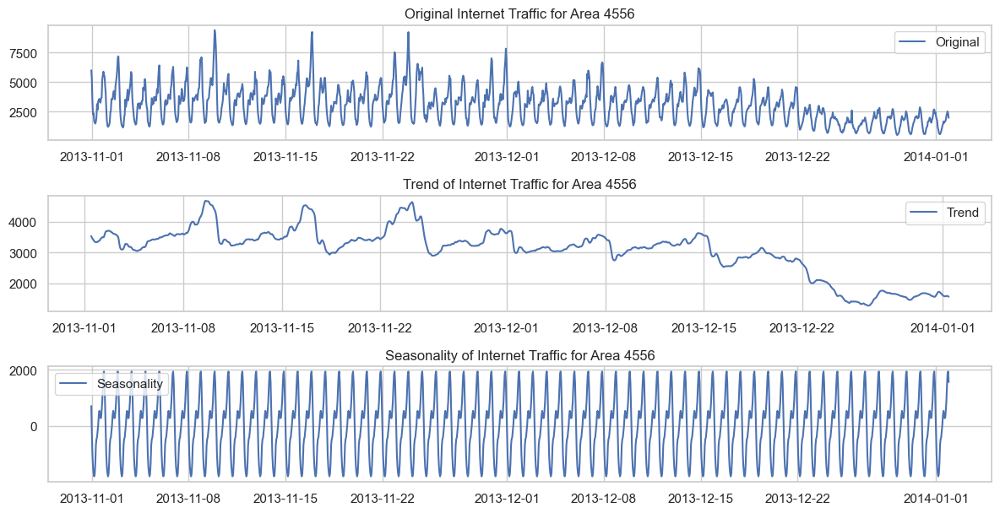

In [159]:
square_ids = [5161, 4159, 4556]

# square_ids = [5161]

for square_id in square_ids:
    df_square = data[data['square_id'] == square_id]
    df_square = df_square.set_index('time_interval')
    
    # Decompose the time series
    decomposition = seasonal_decompose(df_square['internet_traffic'])

    # Plot the original data, the trend, the seasonality, and the residuals 
    plt.figure(figsize=(12,8))
    plt.subplot(411)
    plt.title(f'Original Internet Traffic for Area {square_id}')
    plt.plot(df_square['internet_traffic'], label='Original')
    plt.legend(loc='best')

    plt.subplot(412)
    plt.plot(decomposition.trend, label='Trend')
    plt.title(f'Trend of Internet Traffic for Area {square_id}')
    plt.legend(loc='best')

    plt.subplot(413)
    plt.title(f'Seasonality of Internet Traffic for Area {square_id}')
    plt.plot(decomposition.seasonal, label='Seasonality')
    plt.legend(loc='best')

    plt.tight_layout()
    plt.show()



---
## 2.2 Traffic Prediction


### ACF, PACF


Plot ACF, PACF to find the p and q for ARIMA method.

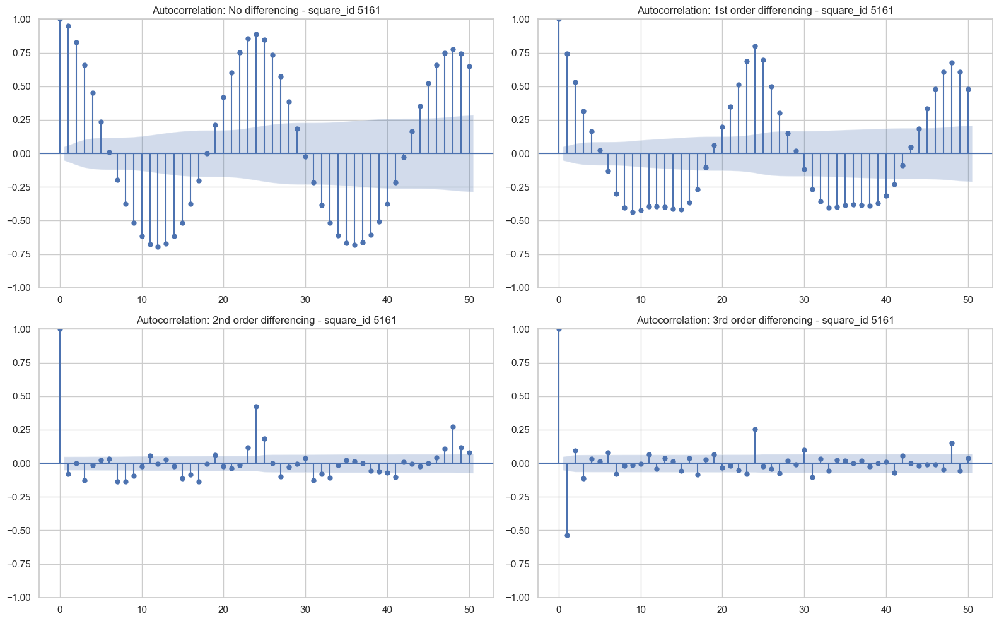

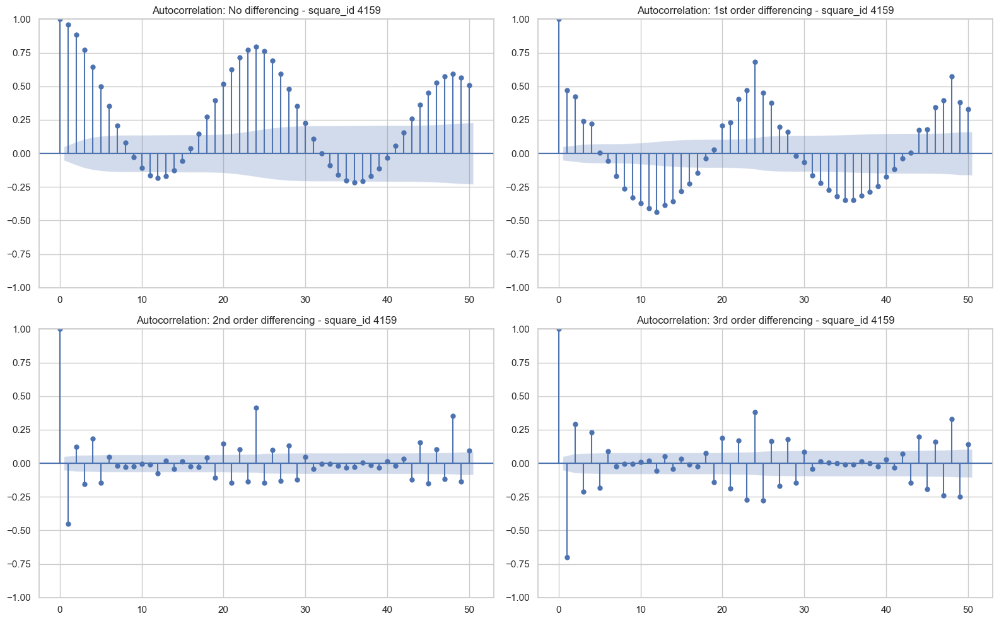

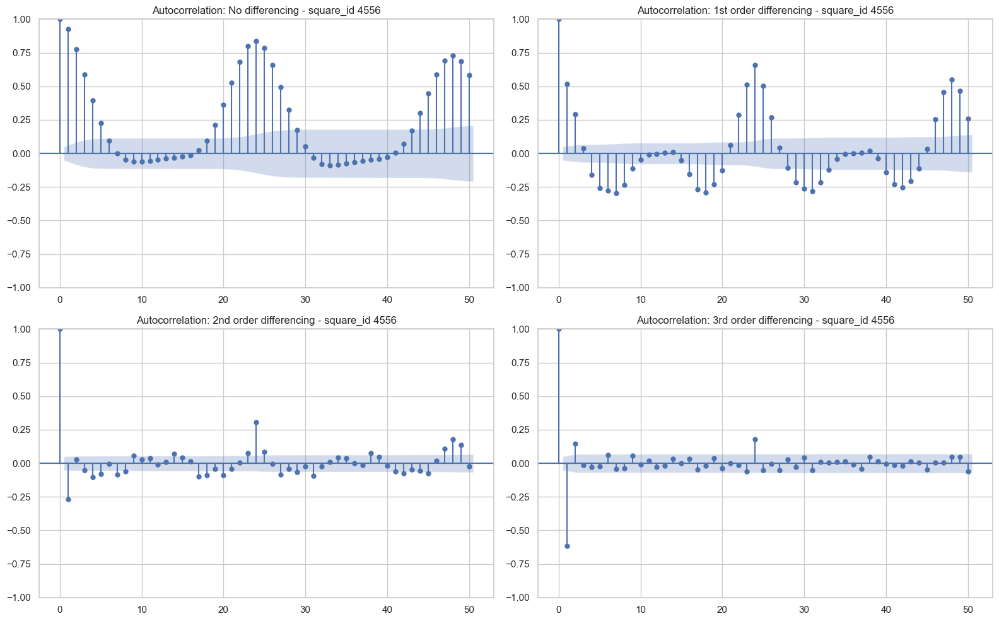

In [163]:
# Perform the test for each square id:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    
    # Plot ACF for different orders of differencing
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    plot_acf(timeseries, ax=axes[0, 0], lags=50)
    axes[0, 0].set_title(f'Autocorrelation: No differencing - square_id {square_id}')

    plot_acf(timeseries.diff().dropna(), ax=axes[0, 1], lags=50)
    axes[0, 1].set_title(f'Autocorrelation: 1st order differencing - square_id {square_id}')

    plot_acf(timeseries.diff().diff().dropna(), ax=axes[1, 0], lags=50)
    axes[1, 0].set_title(f'Autocorrelation: 2nd order differencing - square_id {square_id}')

    plot_acf(timeseries.diff().diff().diff().dropna(), ax=axes[1, 1], lags=50)
    axes[1, 1].set_title(f'Autocorrelation: 3rd order differencing - square_id {square_id}')

    plt.tight_layout()
    plt.show()

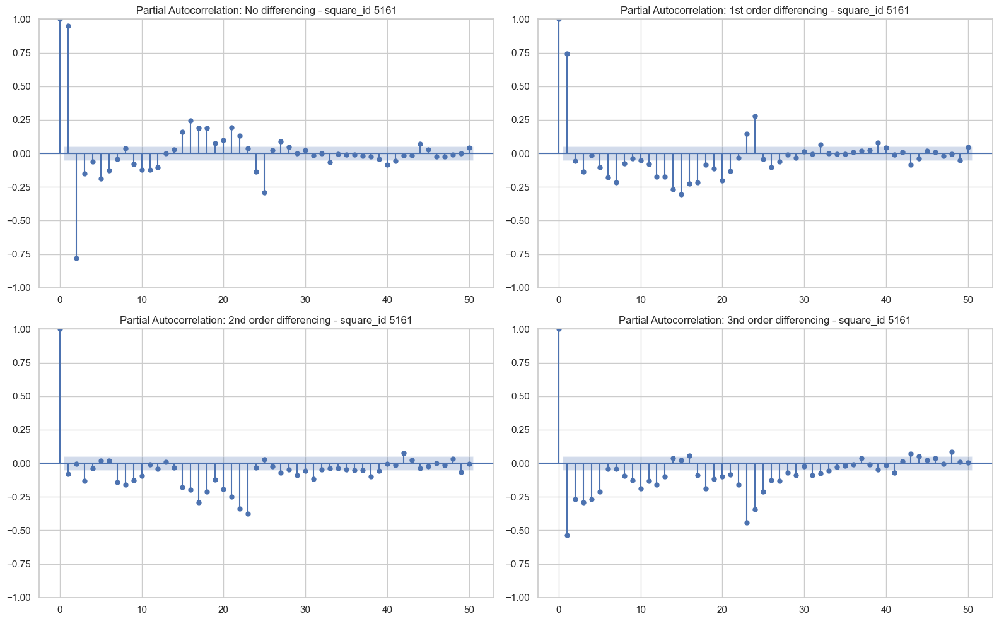

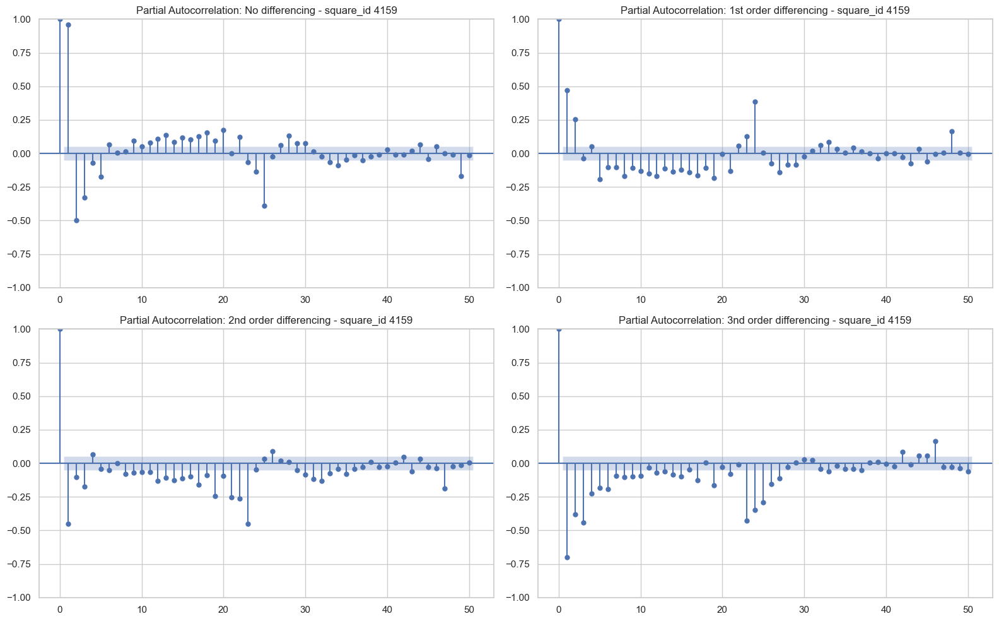

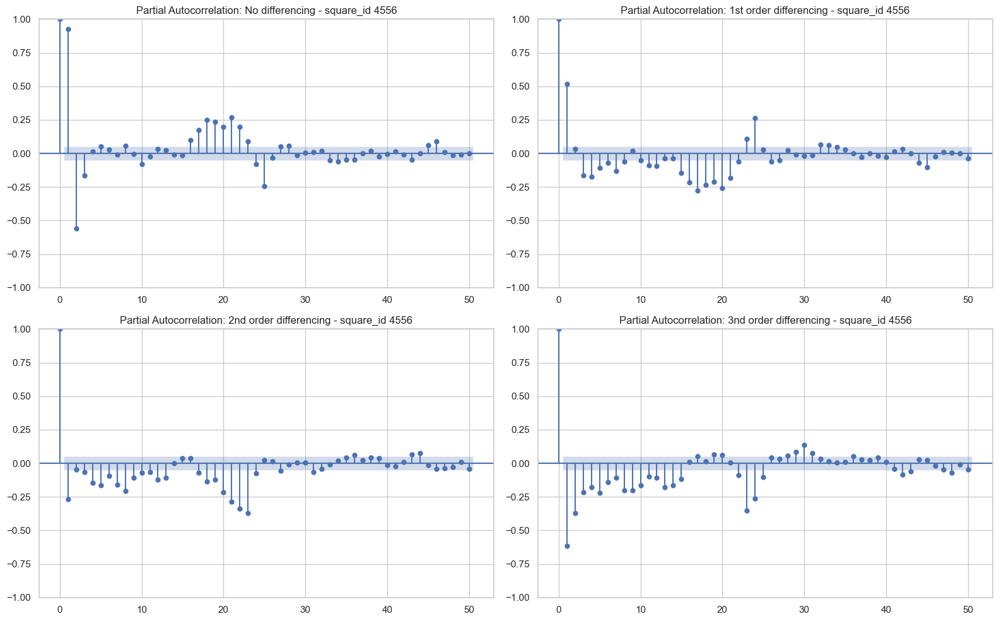

In [170]:
# Perform the test for each square id:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    
    # Plot ACF for different orders of differencing
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))

    plot_pacf(timeseries, ax=axes[0, 0], lags=50)
    axes[0, 0].set_title(f'Partial Autocorrelation: No differencing - square_id {square_id}')

    plot_pacf(timeseries.diff().dropna(), ax=axes[0, 1], lags=50)
    axes[0, 1].set_title(f'Partial Autocorrelation: 1st order differencing - square_id {square_id}')

    plot_pacf(timeseries.diff().diff().dropna(), ax=axes[1, 0], lags=50)
    axes[1, 0].set_title(f'Partial Autocorrelation: 2nd order differencing - square_id {square_id}')

    plot_pacf(timeseries.diff().diff().diff().dropna(), ax=axes[1, 1], lags=50)
    axes[1, 1].set_title(f'Partial Autocorrelation: 3nd order differencing - square_id {square_id}')


    plt.tight_layout()
    plt.show()

### Predictions

In [37]:
# Perform the test for each square id:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]
models_data = pd.DataFrame(columns=['square_id', 'order', 'seasonal_order'])

for square_id in square_ids:
   timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
   timeseries.set_index('time_interval', inplace=True)
   timeseries = timeseries.asfreq('H')  # Setting the frequency
   
   # Split the data into training and test sets
   train = timeseries[:'2013-12-15']
   model = pm.auto_arima(train['internet_traffic'], 
                        start_p=1,   max_p=5,    start_q=1,  max_q=5,    m=24,   d=0,
                        start_P=1,   start_Q=1,  D=0,  
                        seasonal=True,
                        trace=True,
                        error_action='ignore',  
                        suppress_warnings=True, 
                        stepwise=True,
                        width_intercept=False
                     )
   df = pd.concat([df, pd.DataFrame([])], ignore_index=True)

   models_data = pd.concat([models_data, pd.DataFrame({
      'square_id': [square_id],
      'order': [model.order],
      'seasonal_order': [model.seasonal_order]
   })], ignore_index=True)
   
print(models_data)
models_data.to_csv('./ARIMA-model-parameters' + '.csv', index = False)

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(1,0,1)[24] intercept   : AIC=inf, Time=7.29 sec
 ARIMA(0,0,0)(0,0,0)[24] intercept   : AIC=22603.073, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[24] intercept   : AIC=inf, Time=8.76 sec
 ARIMA(0,0,1)(0,0,1)[24] intercept   : AIC=20557.666, Time=2.98 sec
 ARIMA(0,0,0)(0,0,0)[24]             : AIC=23460.088, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[24] intercept   : AIC=21340.164, Time=0.21 sec
 ARIMA(0,0,1)(1,0,1)[24] intercept   : AIC=20347.013, Time=5.88 sec
 ARIMA(0,0,1)(1,0,0)[24] intercept   : AIC=20757.079, Time=5.15 sec
 ARIMA(0,0,1)(2,0,1)[24] intercept   : AIC=inf, Time=33.99 sec
 ARIMA(0,0,1)(1,0,2)[24] intercept   : AIC=20489.069, Time=31.39 sec
 ARIMA(0,0,1)(0,0,2)[24] intercept   : AIC=20242.870, Time=20.03 sec
 ARIMA(0,0,0)(0,0,2)[24] intercept   : AIC=inf, Time=12.93 sec
 ARIMA(1,0,1)(0,0,2)[24] intercept   : AIC=19107.606, Time=18.83 sec
 ARIMA(1,0,1)(0,0,1)[24] intercept   : AIC=19214.691, Time=4.08 sec
 ARIMA(1,0,1)(1,0,2)[24]

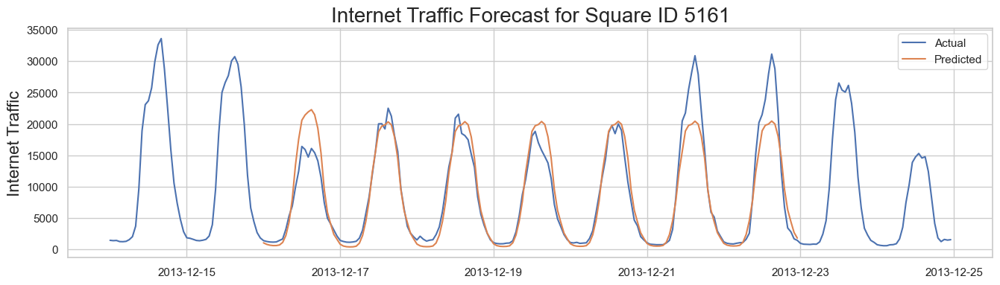

AIC for sarima (Square ID 5161): 18644.39681149649
MAE for sarima (Square ID 5161): 1643.965144298266
MAPE for sarima (Square ID 5161): 0.26055735896589194%


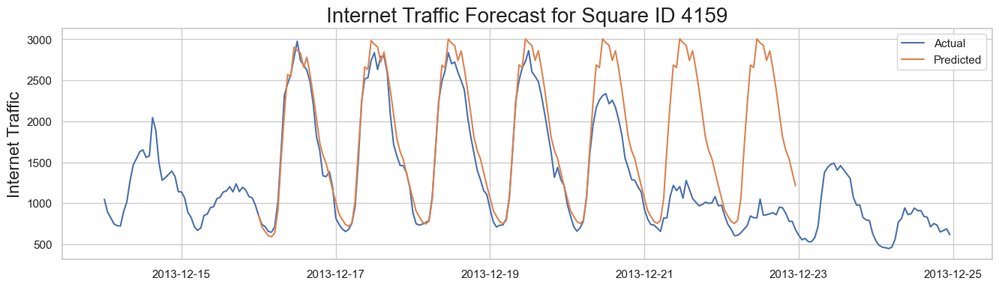

AIC for sarima (Square ID 4159): 14779.145998317468
MAE for sarima (Square ID 4159): 398.82219597572856
MAPE for sarima (Square ID 4159): 0.37350299774428247%


/home/erfan/Project/IMDEA_Homework/imdea_venv/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



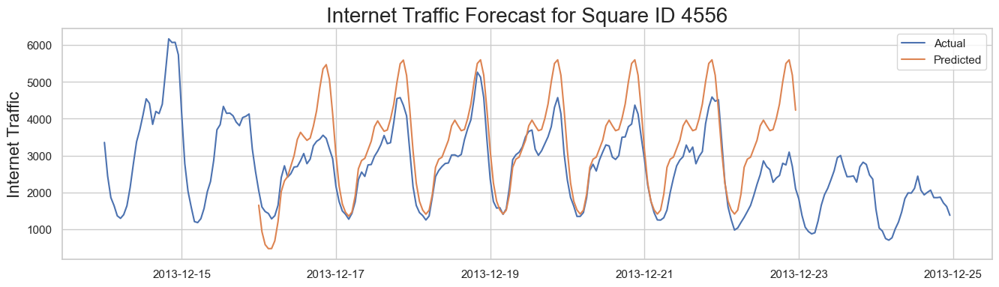

AIC for sarima (Square ID 4556): 16044.244314854159
MAE for sarima (Square ID 4556): 681.6256174917886
MAPE for sarima (Square ID 4556): 0.2645130968534066%


In [212]:
models_data = pd.read_csv('./ARIMA-model-parameters.csv')

# Perform the prediction for each square id:
square_ids = [5161, 4159, 4556]
# square_ids = [5161]

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    timeseries = timeseries.asfreq('H')  # Setting the frequency
    arima_model_param = models_data[models_data['square_id'] == square_id]
    arima_model_param.head()

    # Split the data into training and test sets
    train = timeseries[:'2013-12-15']
    test = timeseries['2013-12-16':'2013-12-22']

    # Define the SARIMAX model
    sarima = SARIMAX(
                train['internet_traffic'], 
                order=eval(arima_model_param['order'].values[0]),
                seasonal_order=eval(arima_model_param['seasonal_order'].values[0])
                )

    # Fit the model
    model_fit = sarima.fit(disp=False, maxiter=300)
    
    # Make predictions for the test set period
    predictions = model_fit.predict(start='2013-12-16 00:00:00', end='2013-12-22 23:00:00')

    # Plot actual vs predicted values
    plt.figure(figsize=(16,4))
    plt.plot(timeseries['2013-12-14':'2013-12-24'], label="Actual")
    plt.plot(predictions, label="Predicted")
    plt.title(f'Internet Traffic Forecast for Square ID {square_id}', fontsize=20)
    plt.ylabel('Internet Traffic', fontsize=16)
    plt.legend()
    plt.show()

    # Calculate and print AIC & MAE & MAPE for both models
    print(f"AIC for sarima (Square ID {square_id}): {model_fit.aic}")
    print(f"MAE for sarima (Square ID {square_id}): {mean_absolute_error(test['internet_traffic'], predictions)}")
    print(f"MAPE for sarima (Square ID {square_id}): {mean_absolute_percentage_error(test['internet_traffic'], predictions)}%")


### LSTM

Epoch 1/50


2023-05-28 18:38:12.739964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


36/36 [==============================] - 4s 21ms/step - loss: 465385536.0000
Epoch 2/50
36/36 [==============================] - 1s 24ms/step - loss: 164106432.0000
Epoch 3/50
36/36 [==============================] - 1s 22ms/step - loss: 138241344.0000
Epoch 4/50
36/36 [==============================] - 1s 22ms/step - loss: 139410032.0000
Epoch 5/50
36/36 [==============================] - 1s 20ms/step - loss: 112282368.0000
Epoch 6/50
36/36 [==============================] - 1s 21ms/step - loss: 95623432.0000
Epoch 7/50
36/36 [==============================] - 1s 21ms/step - loss: 77047032.0000
Epoch 8/50
36/36 [==============================] - 1s 22ms/step - loss: 81842072.0000
Epoch 9/50
36/36 [==============================] - 1s 21ms/step - loss: 78784904.0000
Epoch 10/50
36/36 [==============================] - 1s 20ms/step - loss: 76857920.0000
Epoch 11/50
36/36 [==============================] - 1s 22ms/step - loss: 60498980.0000
Epoch 12/50
36/36 [============================

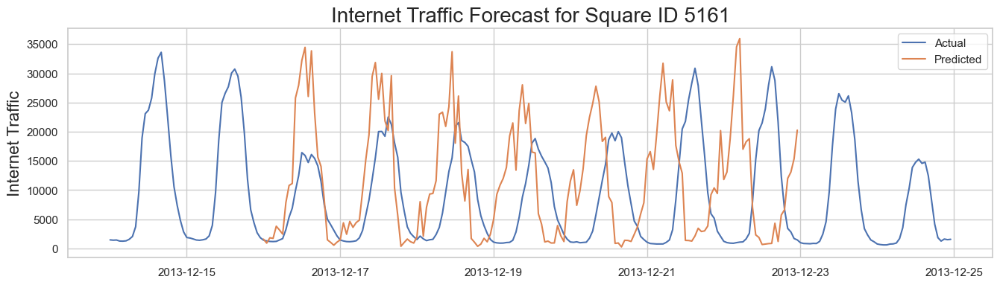

MAE for LSTM (Square ID 5161): 10728.710466330436
MAPE for LSTM (Square ID 5161): 4.206072476918491%
Epoch 1/50


2023-05-28 18:39:06.348359: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


36/36 [==============================] - 5s 20ms/step - loss: 4590444.0000
Epoch 2/50
36/36 [==============================] - 1s 22ms/step - loss: 3869212.5000
Epoch 3/50
36/36 [==============================] - 1s 21ms/step - loss: 2568032.5000
Epoch 4/50
36/36 [==============================] - 1s 22ms/step - loss: 2692233.7500
Epoch 5/50
36/36 [==============================] - 1s 22ms/step - loss: 3125413.2500
Epoch 6/50
36/36 [==============================] - 1s 21ms/step - loss: 2785909.2500
Epoch 7/50
36/36 [==============================] - 1s 20ms/step - loss: 2706837.5000
Epoch 8/50
36/36 [==============================] - 1s 22ms/step - loss: 5884699.0000
Epoch 9/50
36/36 [==============================] - 1s 22ms/step - loss: 6059000.5000
Epoch 10/50
36/36 [==============================] - 1s 22ms/step - loss: 7038559.0000
Epoch 11/50
36/36 [==============================] - 1s 21ms/step - loss: 2276065.7500
Epoch 12/50
36/36 [==============================] - 1s 20ms/st

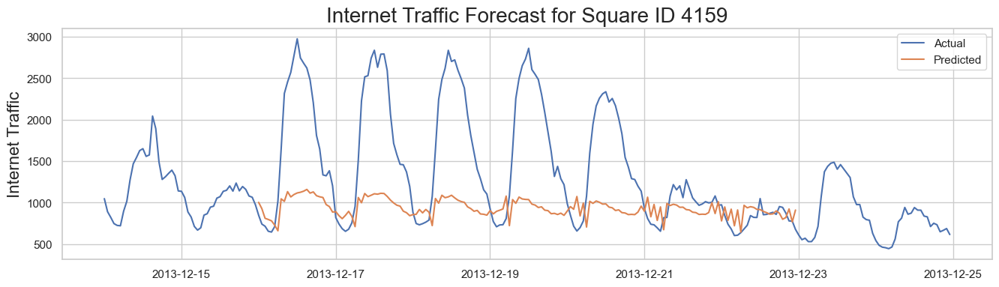

MAE for LSTM (Square ID 4159): 607.2070289681736
MAPE for LSTM (Square ID 4159): 0.33454172106629515%
Epoch 1/50


2023-05-28 18:40:01.557235: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


36/36 [==============================] - 4s 21ms/step - loss: 17735958.0000
Epoch 2/50
36/36 [==============================] - 1s 22ms/step - loss: 8440878.0000
Epoch 3/50
36/36 [==============================] - 1s 22ms/step - loss: 5650706.0000
Epoch 4/50
36/36 [==============================] - 1s 21ms/step - loss: 9410309.0000
Epoch 5/50
36/36 [==============================] - 1s 21ms/step - loss: 10490216.0000
Epoch 6/50
36/36 [==============================] - 1s 22ms/step - loss: 7966962.0000
Epoch 7/50
36/36 [==============================] - 1s 22ms/step - loss: 8377352.5000
Epoch 8/50
36/36 [==============================] - 1s 22ms/step - loss: 8452857.0000
Epoch 9/50
36/36 [==============================] - 1s 20ms/step - loss: 6528888.0000
Epoch 10/50
36/36 [==============================] - 1s 21ms/step - loss: 6684384.0000
Epoch 11/50
36/36 [==============================] - 1s 22ms/step - loss: 4720850.0000
Epoch 12/50
36/36 [==============================] - 1s 23ms/

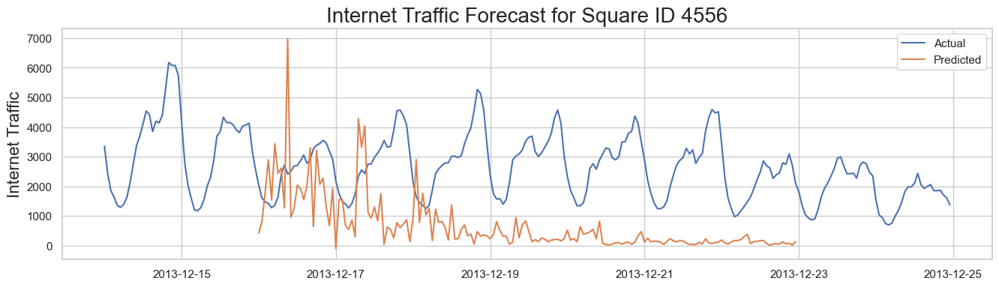

MAE for LSTM (Square ID 4556): 2230.721643241573
MAPE for LSTM (Square ID 4556): 0.7964233910679911%


In [216]:
# Define the square IDs to analyze
square_ids = [5161, 4159, 4556]
K.clear_session()

for square_id in square_ids:
    timeseries = data[data['square_id'] == square_id][['time_interval', 'internet_traffic']]
    timeseries.set_index('time_interval', inplace=True)
    timeseries = timeseries.asfreq('H')  # Setting the frequency

    # Split the data into training and test sets
    train = timeseries[:'2013-12-15']
    test = timeseries['2013-12-16':'2013-12-22']

    # Parameters
    look_back = 24  # use the last 24 hours of data to predict
    forecast_hours = len(test)  # we want to predict 168 hours ahead

    # Create generator
    train_generator = TimeseriesGenerator(train.values, train.values, length=look_back, batch_size=30)

    # Define the LSTM model
    model = Sequential()
    model.add(LSTM(50, activation='relu', input_shape=(look_back, 1), return_sequences=True))
    model.add(LSTM(25, activation='relu', return_sequences=True))
    model.add(LSTM(50, activation='relu', return_sequences=True))
    model.add(LSTM(25, activation='relu', return_sequences=True))
    model.add(LSTM(50, activation='relu'))
    model.add(Dense(1)) 
    model.compile(optimizer='adam', loss='mse')

    # Fit the model
    model.fit(train_generator, epochs=50)

    # Get the predictions
    predictions = []
    batch = train[-look_back:].values.reshape((1, look_back, 1))

    for i in range(forecast_hours):  
        predictions.append(model.predict(batch)[0]) 
        batch = np.append(batch[:,1:,:],[[predictions[i]]],axis=1)

    # Reshape predictions
    reshaped_predictions = np.array(predictions).reshape(-1)

    # Generate corresponding time range for predictions
    pred_times = pd.date_range(start=test.index[0], end=test.index[-1], freq='H')

    # Plot all data within the specified range
    plt.figure(figsize=(16,4))
    plt.plot(timeseries['2013-12-14':'2013-12-24']['internet_traffic'], label="Actual")

    # Plot predicted data
    plt.plot(pred_times, reshaped_predictions, label="Predicted")
    plt.title(f'Internet Traffic Forecast for Square ID {square_id}', fontsize=20)
    plt.ylabel('Internet Traffic', fontsize=16)
    plt.legend()
    plt.show()

    # Calculate and print MAE & MAPE for the model
    print(f"MAE for LSTM (Square ID {square_id}): {mean_absolute_error(test['internet_traffic'], reshaped_predictions)}")
    print(f"MAPE for LSTM (Square ID {square_id}): {mean_absolute_percentage_error(test['internet_traffic'], reshaped_predictions)}")
